In [1]:
import pandas as pd 
import numpy as np 
from sklearn.tree import DecisionTreeClassifier 
from sklearn import tree
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.metrics import accuracy_score , confusion_matrix , roc_auc_score, roc_curve 
from pandas_profiling import ProfileReport

In [4]:
df= pd.read_csv("Downloads/winequality-red.csv")
df.head(10)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.65,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5


In [5]:
ProfileReport(df)

variables:   0%|          | 0/12 [00:00<?, ?it/s]

correlations:   0%|          | 0/6 [00:00<?, ?it/s]

interactions [continuous]:   0%|          | 0/144 [00:00<?, ?it/s]

table:   0%|          | 0/1 [00:00<?, ?it/s]

missing:   0%|          | 0/2 [00:00<?, ?it/s]

warnings:   0%|          | 0/3 [00:00<?, ?it/s]

package:   0%|          | 0/1 [00:00<?, ?it/s]

build report structure:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
X = df.drop(columns='quality')
X

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [24]:
y= df['quality']
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [48]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=.15, random_state= 300)

In [49]:
dt_model  = DecisionTreeClassifier()

In [50]:
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [51]:
dt_model.get_depth()

19

In [52]:
dt_model.predict([[7.4, 0.700, 0.00, 1.9, 0.076, 11.0, 34.0, 0.99780, 3.51, 0.56, 9.4]])

array([6], dtype=int64)

In [53]:
dt_model.predict(x_test)

array([6, 6, 5, 5, 5, 5, 5, 5, 6, 6, 5, 5, 5, 6, 5, 6, 6, 6, 4, 6, 6, 7,
       5, 5, 6, 6, 5, 6, 7, 5, 6, 7, 6, 5, 5, 6, 5, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 5, 6, 4, 6, 6, 5, 6, 5, 5, 6, 7, 5, 6, 6, 6, 5, 6, 7, 6, 5,
       6, 5, 4, 6, 7, 6, 6, 7, 6, 6, 8, 5, 6, 4, 6, 5, 6, 6, 7, 7, 5, 5,
       6, 4, 5, 5, 5, 7, 5, 5, 7, 6, 5, 6, 7, 5, 6, 6, 5, 7, 5, 5, 5, 7,
       6, 5, 5, 6, 5, 7, 6, 5, 6, 5, 6, 5, 6, 5, 6, 7, 7, 5, 6, 6, 6, 6,
       5, 5, 8, 6, 6, 7, 6, 5, 6, 5, 5, 5, 7, 6, 8, 5, 6, 5, 5, 6, 5, 5,
       6, 7, 6, 6, 5, 8, 5, 5, 6, 6, 5, 6, 6, 5, 6, 6, 7, 7, 6, 5, 6, 7,
       5, 6, 5, 5, 6, 6, 6, 6, 6, 6, 6, 5, 5, 5, 5, 5, 7, 6, 6, 6, 6, 6,
       6, 5, 5, 5, 5, 5, 5, 7, 5, 6, 6, 6, 5, 6, 7, 5, 6, 7, 6, 7, 5, 7,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 7, 6, 5, 6, 6, 6, 6],
      dtype=int64)

In [54]:
dt_model.score(x_test,y_test)

0.6291666666666667

In [55]:
dt_en=DecisionTreeClassifier(criterion="entropy")
dt_en

DecisionTreeClassifier(criterion='entropy')

In [56]:
dt_en.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [57]:
dt_en.score(x_test, y_test)

0.6166666666666667

In [62]:
outfile= dot_for_dt_en = open("dt_en_meta.dot", 'w')
tree.export_graphviz(dt_en, out_file = outfile, feature_names= X.columns)

In [63]:
dir()

['DecisionTreeClassifier',
 'GridSearchCV',
 'In',
 'Out',
 'ProfileReport',
 'X',
 '_',
 '_10',
 '_12',
 '_24',
 '_27',
 '_28',
 '_29',
 '_3',
 '_30',
 '_32',
 '_33',
 '_36',
 '_37',
 '_38',
 '_39',
 '_4',
 '_40',
 '_42',
 '_43',
 '_44',
 '_45',
 '_46',
 '_5',
 '_50',
 '_51',
 '_52',
 '_53',
 '_54',
 '_55',
 '_56',
 '_57',
 '_6',
 '_9',
 '__',
 '___',
 '__builtin__',
 '__builtins__',
 '__doc__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '_dh',
 '_i',
 '_i1',
 '_i10',
 '_i11',
 '_i12',
 '_i13',
 '_i14',
 '_i15',
 '_i16',
 '_i17',
 '_i18',
 '_i19',
 '_i2',
 '_i20',
 '_i21',
 '_i22',
 '_i23',
 '_i24',
 '_i25',
 '_i26',
 '_i27',
 '_i28',
 '_i29',
 '_i3',
 '_i30',
 '_i31',
 '_i32',
 '_i33',
 '_i34',
 '_i35',
 '_i36',
 '_i37',
 '_i38',
 '_i39',
 '_i4',
 '_i40',
 '_i41',
 '_i42',
 '_i43',
 '_i44',
 '_i45',
 '_i46',
 '_i47',
 '_i48',
 '_i49',
 '_i5',
 '_i50',
 '_i51',
 '_i52',
 '_i53',
 '_i54',
 '_i55',
 '_i56',
 '_i57',
 '_i58',
 '_i59',
 '_i6',
 '_i60',
 '_i61',
 '_i62',
 '_

In [144]:
df1= df.head(500)
df1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
495,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0,8
496,7.8,0.52,0.25,1.9,0.081,14.0,38.0,0.9984,3.43,0.65,9.0,6
497,7.2,0.34,0.32,2.5,0.090,43.0,113.0,0.9966,3.32,0.79,11.1,5
498,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0,8


In [145]:
x1= df1.drop(columns= 'quality')
x1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
495,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0
496,7.8,0.52,0.25,1.9,0.081,14.0,38.0,0.9984,3.43,0.65,9.0
497,7.2,0.34,0.32,2.5,0.090,43.0,113.0,0.9966,3.32,0.79,11.1
498,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0


In [146]:
y1= df1['quality']
y1

0      5
1      5
2      5
3      6
4      5
      ..
495    8
496    6
497    5
498    8
499    6
Name: quality, Length: 500, dtype: int64

In [147]:
dt_model= DecisionTreeClassifier()

In [148]:
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

[Text(0.5384264248084292, 0.975, 'X[10] <= 10.25\ngini = 0.641\nsamples = 1359\nvalue = [7, 44, 579, 546, 167, 16]'),
 Text(0.3113894875478927, 0.925, 'X[6] <= 62.5\ngini = 0.513\nsamples = 705\nvalue = [5, 23, 440, 218, 18, 1]'),
 Text(0.14931154214559386, 0.875, 'X[9] <= 0.555\ngini = 0.57\nsamples = 453\nvalue = [5, 18, 243, 169, 17, 1]'),
 Text(0.03601532567049808, 0.825, 'X[4] <= 0.069\ngini = 0.443\nsamples = 143\nvalue = [2, 12, 103, 25, 1, 0]'),
 Text(0.014559386973180077, 0.775, 'X[9] <= 0.475\ngini = 0.665\nsamples = 20\nvalue = [1, 2, 8, 8, 1, 0]'),
 Text(0.006130268199233717, 0.725, 'X[8] <= 3.375\ngini = 0.278\nsamples = 6\nvalue = [0, 0, 5, 0, 1, 0]'),
 Text(0.0030651340996168583, 0.675, 'gini = 0.0\nsamples = 5\nvalue = [0, 0, 5, 0, 0, 0]'),
 Text(0.009195402298850575, 0.675, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 0, 1, 0]'),
 Text(0.022988505747126436, 0.725, 'X[5] <= 13.5\ngini = 0.602\nsamples = 14\nvalue = [1, 2, 3, 8, 0, 0]'),
 Text(0.01532567049808429, 0.675, 

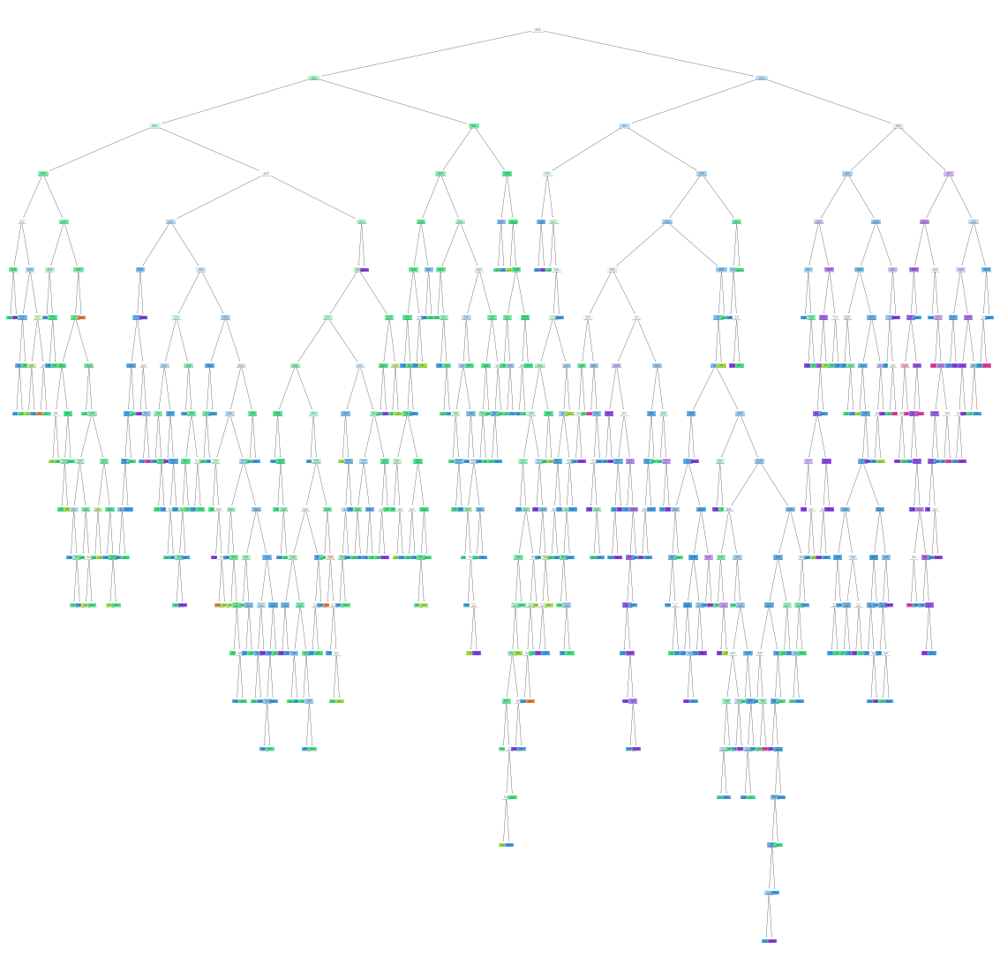

In [149]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model, filled = True)

In [150]:
dt_model1= DecisionTreeClassifier()

In [151]:
dt_model1.fit(x1, y1)

DecisionTreeClassifier()

In [152]:
set(y1)

{3, 4, 5, 6, 7, 8}

In [153]:
import sklearn
from sklearn import tree 
import matplotlib.pyplot as plt
%matplotlib inline

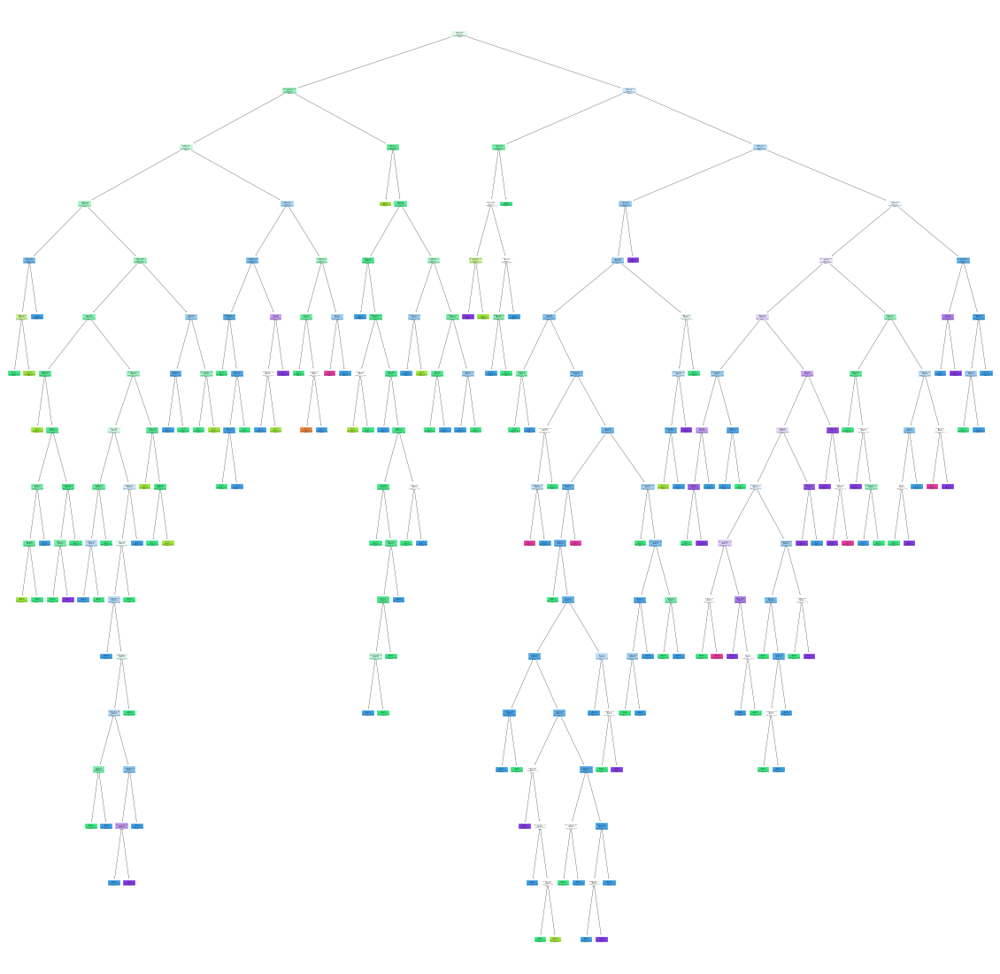

In [156]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled = True, class_names= ['3', '4','5','6','7','8'] ,feature_names=x1.columns)
plt.savefig("dt_model2")

In [157]:
dt_model1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 7, 5, 5, 5,
       5, 5, 5, 6, 6, 5, 5, 4, 5, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 5, 6, 5,
       5, 5, 5, 6, 5, 5, 4, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5,
       5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 7, 5, 5, 5,
       5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 4, 5, 5,
       5, 5, 5, 5, 5, 6, 5, 4, 6, 5, 5, 5, 5, 4, 6, 5, 4, 6, 6, 6, 5, 5,
       5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6,
       7, 4, 7, 5, 5, 5, 6, 7, 7, 5, 5, 7, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5,
       6, 5, 5, 6, 4, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       6, 7, 7, 6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 5, 5, 5, 7, 5, 4, 5, 5,
       5, 7, 4, 8, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6, 8, 7, 6, 7, 5, 7, 5, 5,
       6, 6, 7, 5, 7, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6,

In [158]:
dt_model1.score(x1, y1)

1.0

In [159]:
dt_model1.score(x_test,y_test)

0.6

In [160]:
path= dt_model1.cost_complexity_pruning_path(x1, y1)
path

{'ccp_alphas': array([0.        , 0.00166667, 0.00175   , 0.00181818, 0.00184615,
        0.00188235, 0.00192308, 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.00203333, 0.00261111,
        0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
        0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00271329,
        0.00272222, 0.003     , 0.003     , 0.003     , 0.003     ,
        0.00304762, 0.00305051, 0.00308418, 0.00325   , 0.00328205,
        0.00333333, 0.00333333, 0.00334032, 0.00336606, 0.00342857,
        0.00343316, 0.0035    , 0.0035    , 0.0036    , 0.00363636,
        0.00373333, 0.00373809, 0.0038    , 0.0038237 , 0.004     ,
        0.00404444, 0.00428571, 0.00437662, 0.00462338, 0.00465709,
        0.00466667, 0.0048    , 0.00495726, 0.00504242, 0.00508235,
        0.00509091, 0.00510606, 0.00516667, 0.00568485, 0.00589394,
        0.00656364, 0.00671079, 0.

In [161]:
ccp_alpha=path.ccp_alphas
ccp_alpha

array([0.        , 0.00166667, 0.00175   , 0.00181818, 0.00184615,
       0.00188235, 0.00192308, 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.00203333, 0.00261111,
       0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00271329,
       0.00272222, 0.003     , 0.003     , 0.003     , 0.003     ,
       0.00304762, 0.00305051, 0.00308418, 0.00325   , 0.00328205,
       0.00333333, 0.00333333, 0.00334032, 0.00336606, 0.00342857,
       0.00343316, 0.0035    , 0.0035    , 0.0036    , 0.00363636,
       0.00373333, 0.00373809, 0.0038    , 0.0038237 , 0.004     ,
       0.00404444, 0.00428571, 0.00437662, 0.00462338, 0.00465709,
       0.00466667, 0.0048    , 0.00495726, 0.00504242, 0.00508235,
       0.00509091, 0.00510606, 0.00516667, 0.00568485, 0.00589394,
       0.00656364, 0.00671079, 0.0067591 , 0.00688352, 0.00688

Text(0, 0.5, 'score')

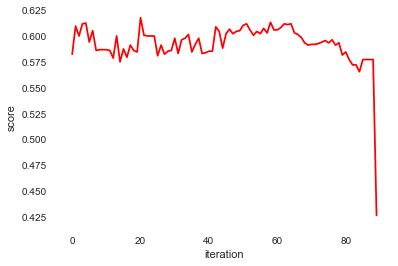

In [162]:
dt_modle2 = []
score=[]
for ccp in ccp_alpha:
    dt_m  = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_modle2.append(dt_m)
    score.append(dt_m.score(x_train,y_train))
    
plt.plot(score, 'r-+')
plt.xlabel('iteration')
plt.ylabel('score')

In [163]:
dt_modle2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002033333333333334),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 DecisionTreeClassifier(ccp_alpha=0.0026276923076923083),
 Deci

In [164]:
train_score= [i.score(x1,y1) for i in dt_modle2]
train_score

[1.0,
 1.0,
 0.996,
 0.996,
 0.992,
 0.988,
 0.986,
 0.958,
 0.962,
 0.96,
 0.966,
 0.96,
 0.96,
 0.962,
 0.96,
 0.962,
 0.958,
 0.964,
 0.964,
 0.95,
 0.946,
 0.932,
 0.932,
 0.93,
 0.932,
 0.93,
 0.93,
 0.928,
 0.93,
 0.93,
 0.926,
 0.918,
 0.92,
 0.92,
 0.918,
 0.908,
 0.908,
 0.91,
 0.904,
 0.9,
 0.902,
 0.902,
 0.896,
 0.892,
 0.888,
 0.884,
 0.884,
 0.886,
 0.882,
 0.878,
 0.876,
 0.874,
 0.872,
 0.862,
 0.858,
 0.858,
 0.846,
 0.842,
 0.848,
 0.824,
 0.828,
 0.814,
 0.81,
 0.804,
 0.802,
 0.794,
 0.79,
 0.786,
 0.784,
 0.78,
 0.776,
 0.776,
 0.772,
 0.768,
 0.762,
 0.758,
 0.742,
 0.728,
 0.718,
 0.698,
 0.69,
 0.682,
 0.676,
 0.676,
 0.636,
 0.596,
 0.596,
 0.596,
 0.596,
 0.478]

In [165]:
test_score= [i.score(x_test, y_test) for i in dt_modle2]
test_score

[0.575,
 0.625,
 0.6208333333333333,
 0.6375,
 0.625,
 0.5916666666666667,
 0.6125,
 0.6083333333333333,
 0.6,
 0.5958333333333333,
 0.6,
 0.5916666666666667,
 0.5791666666666667,
 0.6,
 0.5916666666666667,
 0.6083333333333333,
 0.5916666666666667,
 0.5958333333333333,
 0.5833333333333334,
 0.575,
 0.6333333333333333,
 0.6166666666666667,
 0.6208333333333333,
 0.6166666666666667,
 0.625,
 0.6,
 0.6166666666666667,
 0.6083333333333333,
 0.6083333333333333,
 0.625,
 0.6208333333333333,
 0.5958333333333333,
 0.6208333333333333,
 0.625,
 0.625,
 0.5875,
 0.6041666666666666,
 0.6041666666666666,
 0.5833333333333334,
 0.5708333333333333,
 0.5875,
 0.5833333333333334,
 0.6125,
 0.6083333333333333,
 0.5875,
 0.5958333333333333,
 0.6041666666666666,
 0.6083333333333333,
 0.6208333333333333,
 0.6,
 0.6041666666666666,
 0.6083333333333333,
 0.6041666666666666,
 0.5958333333333333,
 0.6,
 0.5916666666666667,
 0.575,
 0.575,
 0.5875,
 0.5708333333333333,
 0.5833333333333334,
 0.5666666666666667,
 0

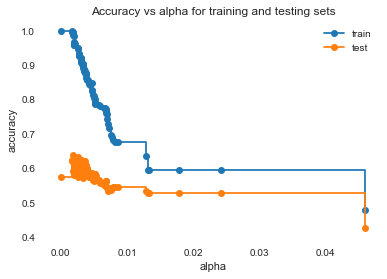

In [168]:
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha, train_score, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alpha, test_score, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [169]:
dt_model_ccp=DecisionTreeClassifier(random_state= 0, ccp_alpha= 0.014)
dt_model_ccp.fit(x1,y1)


DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(0.5, 0.8333333333333334, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(0.25, 0.5, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(0.125, 0.16666666666666666, 'gini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(0.375, 0.16666666666666666, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]'),
 Text(0.75, 0.5, 'X[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(0.625, 0.16666666666666666, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(0.875, 0.16666666666666666, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

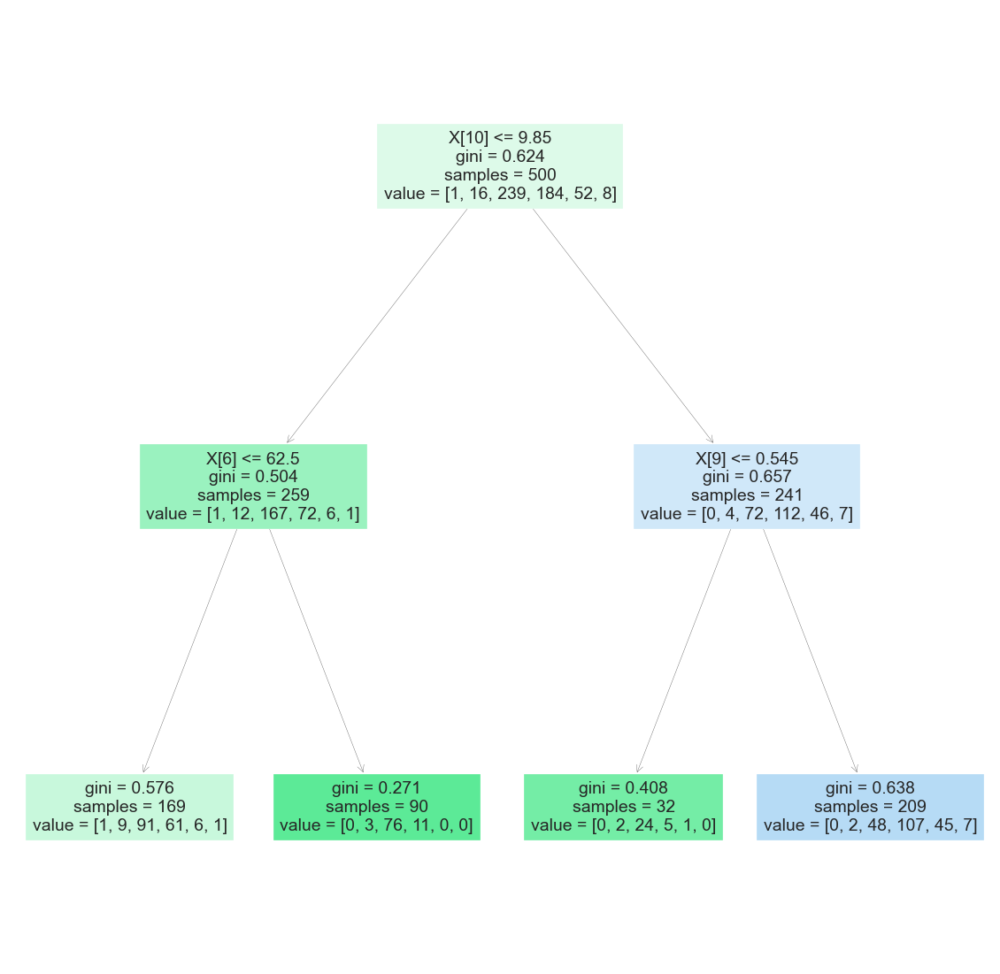

In [170]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True)

In [171]:
dt_model_ccp.score(x1,y1)

0.596

In [172]:
dt_model_ccp.score(x_test, y_test)

0.5291666666666667

In [177]:
DecisionTreeClassifier()

DecisionTreeClassifier()

In [178]:
grid_pram = {"criterion":['gini','entropy'],
             "splitter":['best','random'],
             "max_depth" : range(2,8,1),
             "min_samples_split":range(2,8 ,1),
             "min_samples_leaf":range(1,8,1),
             'ccp_alpha':np.random.rand(20)
             }

In [179]:
grid_ccp = GridSearchCV(estimator=dt_model_ccp,param_grid=grid_pram, cv = 4, n_jobs=-1)

In [181]:
grid_ccp.fit(x1,y1)

GridSearchCV(cv=4,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'ccp_alpha': array([0.18495108, 0.27676754, 0.28790473, 0.22626753, 0.65953757,
       0.77537998, 0.05309559, 0.15530869, 0.61880782, 0.50062193,
       0.96689803, 0.30221416, 0.28406844, 0.09389907, 0.36078554,
       0.32793565, 0.09265539, 0.67263346, 0.39433004, 0.66697964]),
                         'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 8),
                         'min_samples_leaf': range(1, 8),
                         'min_samples_split': range(2, 8),
                         'splitter': ['best', 'random']})

In [182]:
grid_ccp.best_params_

{'ccp_alpha': 0.05309559438032019,
 'criterion': 'entropy',
 'max_depth': 2,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'splitter': 'best'}

In [190]:
dt_ccp_new= DecisionTreeClassifier(criterion='entropy' , max_depth=2 ,min_samples_leaf=1 , min_samples_split=2 , splitter='best',ccp_alpha=0.0530955943803201914 )

In [191]:
dt_ccp_new.fit(x1, y1)

DecisionTreeClassifier(ccp_alpha=0.05309559438032019, criterion='entropy',
                       max_depth=2)

In [192]:
dt_ccp_new.score(x1, y1)

0.58

In [193]:
dt_ccp_new.score(x_test,y_test)

0.5166666666666667

In [195]:
pred = dt_ccp_new.predict(x_train)

In [196]:
confusion_matrix(y_train,pred, labels=None)

array([[  0,   0,   6,   1,   0,   0],
       [  0,   0,  36,   8,   0,   0],
       [  0,   0, 467, 112,   0,   0],
       [  0,   0, 253, 293,   0,   0],
       [  0,   0,  31, 136,   0,   0],
       [  0,   0,   1,  15,   0,   0]], dtype=int64)

[[  0   0   6   1   0   0]
 [  0   0  36   8   0   0]
 [  0   0 467 112   0   0]
 [  0   0 253 293   0   0]
 [  0   0  31 136   0   0]
 [  0   0   1  15   0   0]]


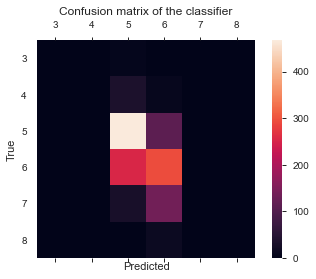

In [200]:
from sklearn.metrics import confusion_matrix

labels = ['3', '4', '5','6', '7', '8']
cm = confusion_matrix(y_train, pred)
print(cm)
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(cm)
plt.title('Confusion matrix of the classifier')
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [201]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [204]:
x= df.drop(columns= ['quality'])
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [206]:
y = df.quality
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [222]:
from sklearn.ensemble import BaggingClassifier

In [223]:
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state= 0)

In [224]:
bag_dt = BaggingClassifier(DecisionTreeClassifier(), n_estimators=10)

In [226]:
bag_dt.fit(x_train, y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier())

In [227]:
bag_dt.predict(x_test)

array([6, 5, 7, 5, 5, 6, 5, 6, 5, 5, 5, 5, 6, 6, 6, 7, 7, 5, 5, 4, 6, 5,
       6, 7, 6, 5, 5, 6, 5, 6, 6, 6, 6, 5, 7, 7, 5, 6, 6, 7, 5, 7, 7, 7,
       6, 5, 5, 6, 5, 6, 5, 5, 6, 6, 6, 5, 5, 5, 7, 5, 5, 6, 6, 6, 5, 6,
       5, 5, 6, 6, 6, 5, 4, 5, 6, 6, 5, 5, 5, 7, 6, 5, 6, 5, 6, 5, 6, 5,
       5, 5, 5, 6, 6, 5, 7, 6, 6, 5, 5, 5, 7, 6, 6, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 6, 5, 6, 6, 5, 7, 6, 6, 5, 5, 6, 5, 6, 7, 5, 5, 5, 7, 5, 5,
       6, 6, 6, 5, 6, 5, 6, 5, 6, 5, 5, 6, 5, 6, 6, 6, 5, 5, 6, 5, 5, 5,
       6, 5, 6, 6, 6, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6, 6, 6, 5, 4, 7, 6, 6,
       5, 7, 7, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 6, 6, 5, 6, 6, 5, 5, 5, 6,
       5, 5, 5, 6, 6, 6, 6, 5, 5, 6, 6, 6, 6, 6, 5, 6, 5, 6, 5, 7, 6, 5,
       5, 5, 7, 5, 6, 6, 6, 6, 6, 5, 5, 6, 5, 5, 6, 6, 6, 7, 7, 6, 5, 5,
       5, 5, 6, 5, 5, 5, 5, 7, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6, 5, 6, 5, 6,
       5, 5, 5, 5, 5, 6, 5, 6, 6, 6, 5, 6, 6, 6, 6, 6, 5, 7, 6, 5, 6, 5,
       5, 5, 7, 6, 5, 5, 6, 6, 5, 6, 6, 6, 5, 5, 6,

In [229]:
bag_dt.base_estimator

DecisionTreeClassifier()

In [230]:
bag_dt.classes_

array([3, 4, 5, 6, 7, 8], dtype=int64)

In [233]:
from sklearn.neighbors import KNeighborsClassifier

In [234]:
bag_knn = BaggingClassifier(KNeighborsClassifier(6), n_estimators=10 )

In [235]:
bag_knn.fit(x,y)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6))

In [237]:
bag_knn.predict(x_test)

array([5, 6, 7, 6, 6, 5, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 7, 7, 5, 5, 7, 6,
       6, 5, 6, 5, 5, 6, 5, 6, 6, 6, 5, 5, 7, 7, 5, 6, 7, 6, 5, 7, 6, 6,
       5, 5, 6, 6, 5, 6, 6, 5, 6, 7, 6, 5, 5, 5, 7, 5, 5, 6, 6, 5, 5, 6,
       5, 5, 8, 7, 5, 5, 6, 5, 6, 6, 5, 6, 5, 6, 5, 5, 5, 6, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 4, 5, 6, 5, 6, 5, 7, 6, 6, 6, 5, 6, 5, 5, 6, 5,
       6, 5, 7, 6, 5, 7, 5, 7, 7, 6, 5, 7, 5, 5, 5, 5, 5, 5, 5, 7, 6, 5,
       6, 6, 6, 5, 6, 5, 6, 5, 6, 5, 6, 5, 5, 6, 7, 6, 7, 6, 5, 5, 5, 6,
       6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 5, 6, 6, 6, 5, 5, 5, 6, 6, 7, 5,
       7, 7, 6, 5, 5, 6, 6, 6, 7, 5, 6, 6, 5, 6, 6, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 6, 6, 6, 5, 5, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5, 6, 6, 5,
       5, 5, 6, 6, 5, 5, 6, 6, 6, 5, 5, 6, 6, 5, 7, 6, 6, 6, 7, 6, 6, 6,
       5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 6, 6, 7, 5, 6, 6, 5,
       5, 6, 5, 5, 6, 5, 5, 5, 6, 5, 6, 6, 5, 6, 6, 7, 6, 5, 5, 5, 6, 5,
       5, 5, 6, 6, 5, 6, 5, 6, 5, 6, 5, 5, 5, 5, 6,

In [238]:
from sklearn.ensemble import RandomForestClassifier

In [258]:
rf = RandomForestClassifier(n_estimators=90)

In [259]:
rf. fit(x_train, y_train)

RandomForestClassifier(n_estimators=90)

In [260]:
rf.score(x_test, y_test)

0.6925

In [250]:
bag_dt.score(x_test, y_test)

0.7

In [251]:
bag_knn.score(x_test, y_test)

0.64

In [265]:
rf.estimators_

[DecisionTreeClassifier(max_features='auto', random_state=642807510),
 DecisionTreeClassifier(max_features='auto', random_state=613325859),
 DecisionTreeClassifier(max_features='auto', random_state=1727445932),
 DecisionTreeClassifier(max_features='auto', random_state=1532544240),
 DecisionTreeClassifier(max_features='auto', random_state=26751742),
 DecisionTreeClassifier(max_features='auto', random_state=1381561546),
 DecisionTreeClassifier(max_features='auto', random_state=1544607680),
 DecisionTreeClassifier(max_features='auto', random_state=88646564),
 DecisionTreeClassifier(max_features='auto', random_state=1227157989),
 DecisionTreeClassifier(max_features='auto', random_state=1797653672),
 DecisionTreeClassifier(max_features='auto', random_state=1146315100),
 DecisionTreeClassifier(max_features='auto', random_state=1242723952),
 DecisionTreeClassifier(max_features='auto', random_state=1804641921),
 DecisionTreeClassifier(max_features='auto', random_state=611799875),
 DecisionTree

In [262]:
rf.estimators_[1]

DecisionTreeClassifier(max_features='auto', random_state=613325859)

[Text(0.47673465372507867, 0.9722222222222222, 'X[4] <= 0.076\ngini = 0.655\nsamples = 746\nvalue = [14, 45, 477, 490, 159, 14]'),
 Text(0.22671825813221405, 0.9166666666666666, 'X[10] <= 10.525\ngini = 0.69\nsamples = 289\nvalue = [3, 25, 134, 196, 92, 10]'),
 Text(0.1259181532004197, 0.8611111111111112, 'X[3] <= 2.9\ngini = 0.626\nsamples = 129\nvalue = [3, 13, 97, 81, 14, 1]'),
 Text(0.07135362014690451, 0.8055555555555556, 'X[9] <= 0.525\ngini = 0.635\nsamples = 114\nvalue = [3, 12, 81, 80, 14, 1]'),
 Text(0.015739769150052464, 0.75, 'X[0] <= 5.45\ngini = 0.498\nsamples = 24\nvalue = [0, 6, 25, 5, 1, 0]'),
 Text(0.011542497376705142, 0.6944444444444444, 'gini = 0.0\nsamples = 1\nvalue = [0, 3, 0, 0, 0, 0]'),
 Text(0.01993704092339979, 0.6944444444444444, 'X[10] <= 9.25\ngini = 0.429\nsamples = 23\nvalue = [0, 3, 25, 5, 1, 0]'),
 Text(0.008394543546694649, 0.6388888888888888, 'X[5] <= 15.0\ngini = 0.48\nsamples = 3\nvalue = [0, 2, 0, 3, 0, 0]'),
 Text(0.004197271773347324, 0.5833333

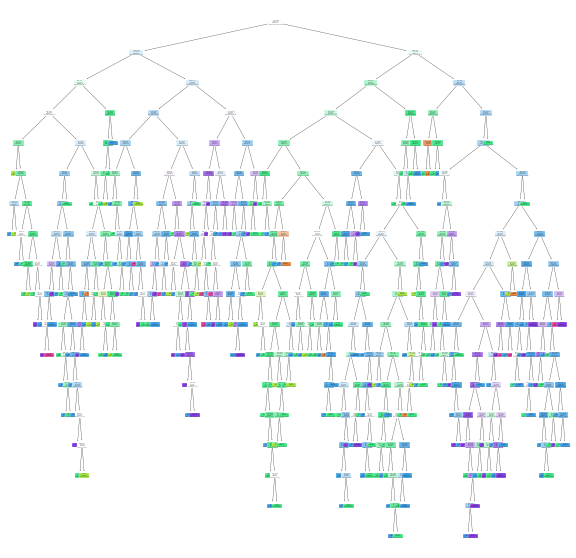

In [266]:
plt.figure(figsize= (10,10))
tree.plot_tree(rf.estimators_[1], filled= True)

In [ ]:
plt.figure(fig_size=(10,10))

for i in range(len(rf.estimators_)):
    tree.plot_tree(rf.estimators_[i], filled= True)

In [276]:
grid_pram = {"n_estimators":[5, 10, 50, 100, 120],
             "criterion":['gini','entropy'],
             "max_depth" : range(10),
             "min_samples_leaf":range(10)
            }
             

In [277]:
rf= RandomForestClassifier(n_estimators=5)

In [278]:
grid_search_rf = GridSearchCV(estimator=rf, param_grid=grid_pram, cv = 4, n_jobs=-1, verbose= 1)

In [279]:
grid_search_rf.fit(x_train, y_train)

Fitting 4 folds for each of 1000 candidates, totalling 4000 fits


GridSearchCV(cv=4, estimator=RandomForestClassifier(n_estimators=5), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(0, 10),
                         'min_samples_leaf': range(0, 10),
                         'n_estimators': [5, 10, 50, 100, 120]},
             verbose=1)

In [280]:
grid_search_rf.best_params_

{'criterion': 'entropy',
 'max_depth': 9,
 'min_samples_leaf': 1,
 'n_estimators': 120}

In [283]:
rf_new= RandomForestClassifier(criterion= 'entropy',
 max_depth= 9,
 min_samples_leaf= 1,
 n_estimators= 120)

In [284]:
rf_new.fit(x_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=9, n_estimators=120)

In [286]:
rf_new.predict(x_test)

array([6, 5, 7, 5, 5, 6, 5, 6, 5, 5, 5, 5, 6, 6, 6, 7, 7, 5, 5, 5, 6, 5,
       6, 6, 5, 5, 5, 7, 5, 6, 6, 6, 6, 5, 7, 7, 5, 6, 6, 6, 5, 6, 7, 7,
       6, 5, 5, 6, 5, 6, 5, 5, 6, 6, 6, 5, 5, 5, 7, 6, 5, 6, 6, 6, 5, 6,
       5, 5, 7, 6, 5, 5, 5, 5, 6, 6, 5, 5, 5, 7, 6, 5, 6, 6, 6, 5, 6, 5,
       5, 5, 5, 5, 6, 5, 7, 5, 6, 5, 5, 6, 7, 6, 6, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 7, 5, 6, 6, 5, 7, 6, 6, 5, 6, 5, 5, 6, 7, 5, 5, 6, 7, 5, 5,
       6, 6, 6, 5, 6, 5, 6, 5, 6, 5, 5, 6, 5, 6, 7, 6, 6, 5, 6, 6, 5, 5,
       6, 6, 6, 5, 6, 6, 6, 6, 7, 5, 5, 5, 6, 6, 6, 6, 6, 6, 5, 7, 5, 6,
       5, 7, 7, 5, 5, 7, 6, 6, 7, 5, 6, 6, 5, 6, 6, 6, 5, 6, 5, 5, 5, 5,
       5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 5, 6, 6, 6, 6, 5,
       5, 6, 6, 6, 6, 6, 6, 6, 6, 5, 5, 6, 5, 6, 6, 6, 6, 7, 7, 6, 5, 6,
       5, 5, 6, 5, 5, 5, 5, 7, 5, 5, 5, 5, 5, 6, 5, 5, 5, 7, 5, 6, 5, 6,
       5, 5, 5, 5, 5, 7, 5, 5, 5, 6, 6, 6, 6, 5, 6, 6, 5, 7, 5, 6, 6, 5,
       5, 5, 7, 6, 5, 5, 6, 5, 5, 6, 6, 5, 5, 5, 6,

In [287]:
rf_new.score(x_test, y_test)

0.67